## Трейдинг с помощью нейронных сетей на базах компаний Яндекс, Газпром и полиметаллах.


In [ ]:
# Загружаем базу 'ТРЕЙДИНГ'
терра_ии.загрузить_базу('ТРЕЙДИНГ', 
                    справка = 'Показать')

Загрузка данных завершена 

url: https://storage.googleapis.com/terra_ai/DataSets/shares.zip
Загружены базы акций трех вариантов: полиметаллы, газпром и яндекс



### Полиметаллы на 1 день вперед, 10 дней

In [ ]:
# Формируем обучающую и проверочную выборки
количество_анализируемых_дней = 10
период_предсказания = 1
(обучающая_выборка, метки_обучающей_выборки), (тестовая_выборка, метки_тестовой_выборки), данные  = терра_ии.создать_выборки_для_торговли(
    акции= 'Полиметаллы',
    количество_анализируемых_дней=количество_анализируемых_дней,
    период_предсказания=период_предсказания)

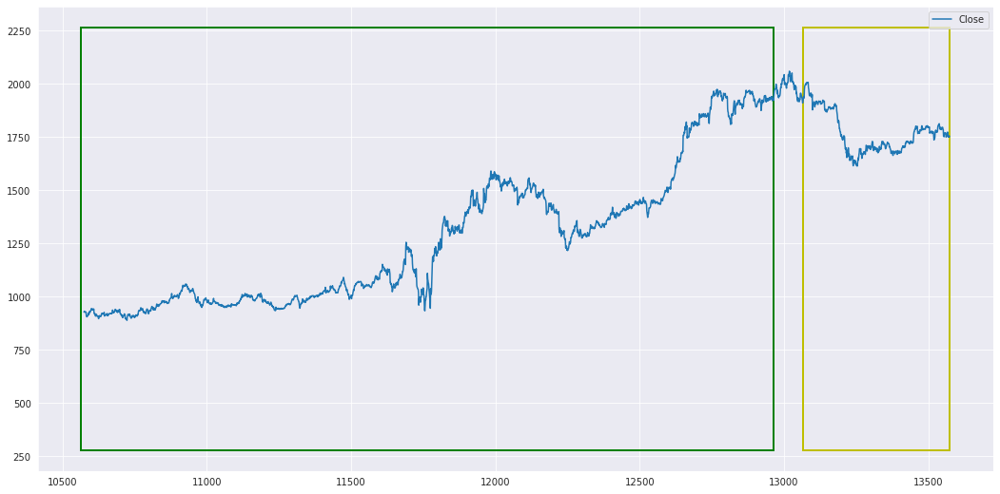

In [ ]:
# показываем пример графика закрытия акций
терра_ии.показать_примеры_для_трейдинга(данные)

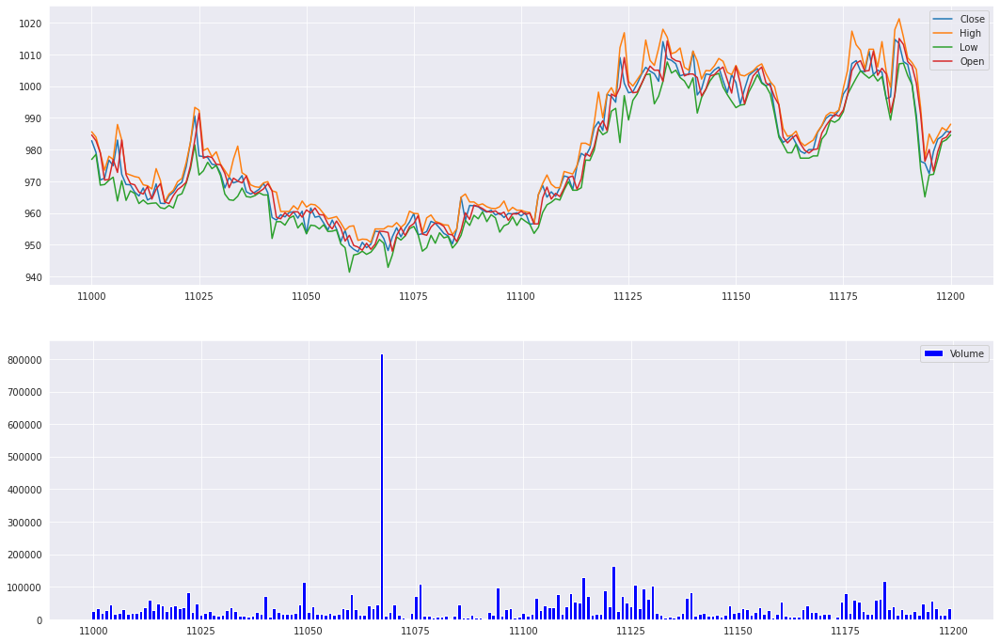

In [ ]:
терра_ии.показать_примеры_для_интервала(данные, 11000, 11200) # Указываем промежуток, где первое число начало интервала, а второе число - окончание 

In [ ]:
# Указываем слои создаваемой модели
слои = 'Выравнивающий Полносвязный-700 Полносвязный-3'

# Получаем входной размер данных
входной_размер = терра_ии.получить_входной_размер(обучающая_выборка)

# Создаем модель
нейронка_трейдинг_1 = терра_ии.создать_сеть(
    слои = слои,
    входной_размер = входной_размер,
    задача = 'временной ряд'
    )

Создана модель нейронной сети!


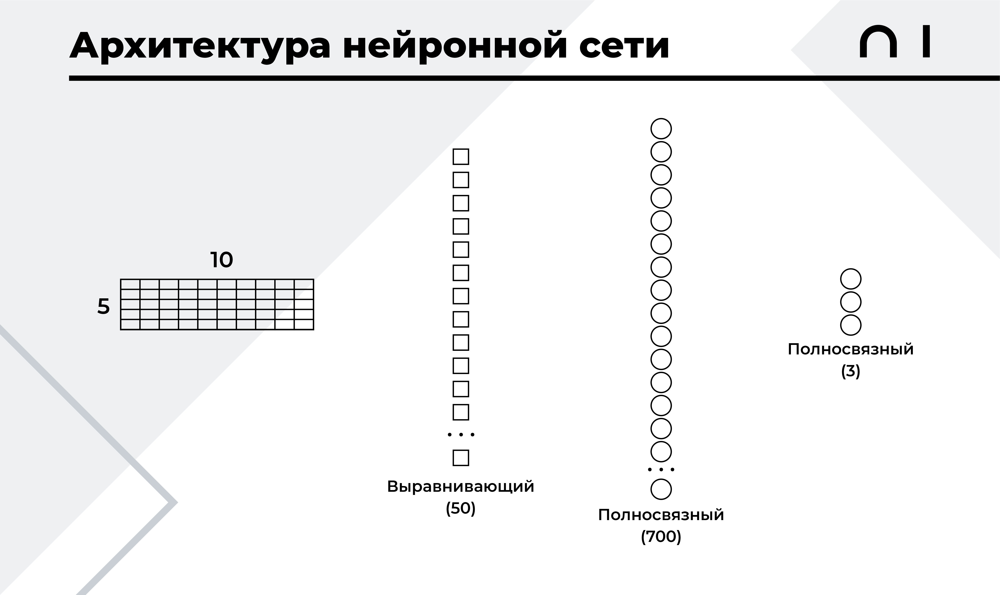

Схема модели:


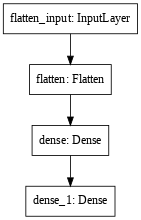

In [ ]:
# Выводим структуру модели
терра_ии.схема_модели(нейронка_трейдинг_1)

Эпоха №1    Время обучения: 0.73c   Точность на обучающей выборке: 62.18%    Точность на проверочной выборке: 64.58%
Эпоха №2    Время обучения: 0.14c   Точность на обучающей выборке: 71.38%    Точность на проверочной выборке: 66.95%
Эпоха №3    Время обучения: 0.13c   Точность на обучающей выборке: 74.31%    Точность на проверочной выборке: 62.2%
Эпоха №4    Время обучения: 0.14c   Точность на обучающей выборке: 80.08%    Точность на проверочной выборке: 60.68%
Эпоха №5    Время обучения: 0.14c   Точность на обучающей выборке: 78.03%    Точность на проверочной выборке: 73.22%
Эпоха №6    Время обучения: 0.13c   Точность на обучающей выборке: 81.17%    Точность на проверочной выборке: 76.27%
Эпоха №7    Время обучения: 0.12c   Точность на обучающей выборке: 81.8%     Точность на проверочной выборке: 71.86%
Эпоха №8    Время обучения: 0.13c   Точность на обучающей выборке: 79.29%    Точность на проверочной выборке: 72.71%
Эпоха №9    Время обучения: 0.15c   Точность на обучающей выборке

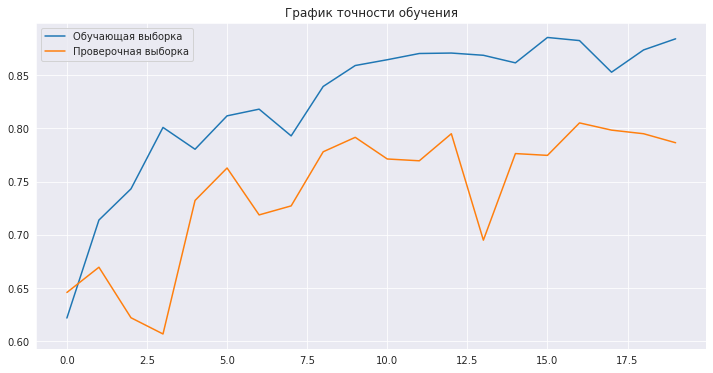

In [ ]:
# Обучаем модель
эксперимент_1 = терра_ии.обучение_модели(
    нейронка_трейдинг_1,
    обучающая_выборка, метки_обучающей_выборки,
    тестовая_выборка, метки_тестовой_выборки,
    размер_пакета = 64,
    количество_эпох = 20)

In [ ]:
# Тестируем модель
терра_ии.тест_модели_торговли(
    нейронка_трейдинг_1, 
    тестовая_выборка, метки_тестовой_выборки,
    данные,
    период_предсказания,
    количество_анализируемых_дней)


Результат теста:
  * Количество отсчетов: 590
  * Правильных предсказаний: 475
  * Ошибочных предсказаний:  115

  * Точность предсказаний: 80.51%


Примеры распознавания

________________________________________
Тест №1
Модель предсказала: падающий тренд
Правильный ответ:  падающий тренд
Текущая цена:  2035.5
Цена через 1 интервал(а): 2009.9


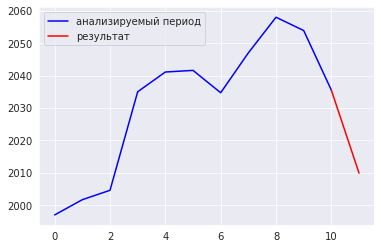

________________________________________
Тест №2
Модель предсказала: нейтральный тренд
Правильный ответ:  нейтральный тренд
Текущая цена:  2031.5
Цена через 1 интервал(а): 2034.7


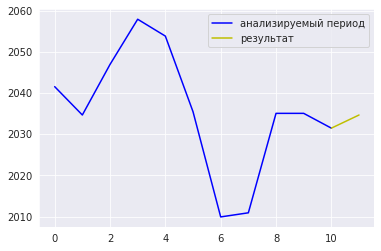

________________________________________
Тест №3
Модель предсказала: нейтральный тренд
Правильный ответ:  нейтральный тренд
Текущая цена:  2034.7
Цена через 1 интервал(а): 2030.2


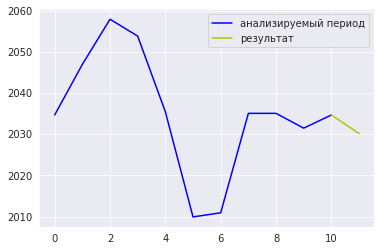

________________________________________
Тест №4
Модель предсказала: падающий тренд
Правильный ответ:  падающий тренд
Текущая цена:  2002.0
Цена через 1 интервал(а): 1978.5


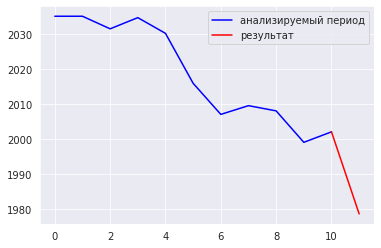

In [ ]:
терра_ии.примеры_распознавания(
          нейронка_трейдинг_1, 
          период_предсказания, 
          количество_анализируемых_дней)

Стартовый капитал: 100000
Прирост после торгов: + 48732
Итого: 148732


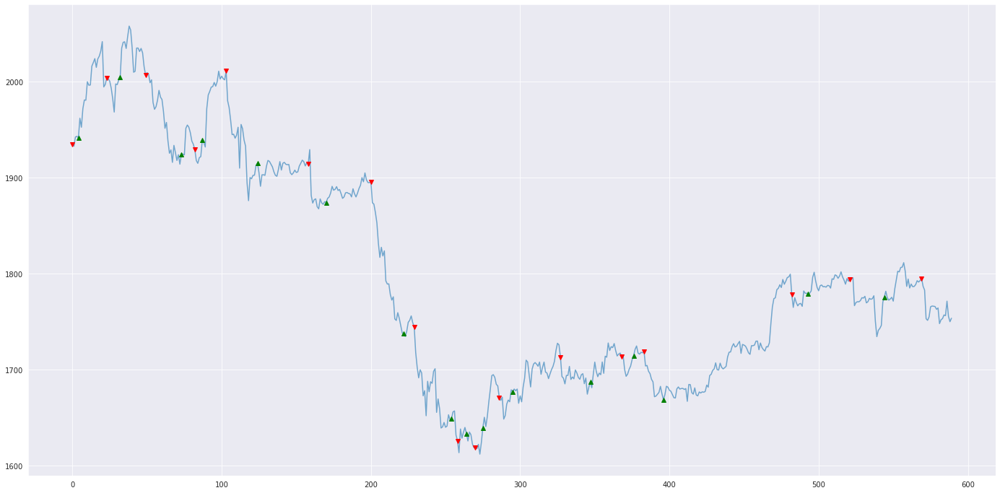

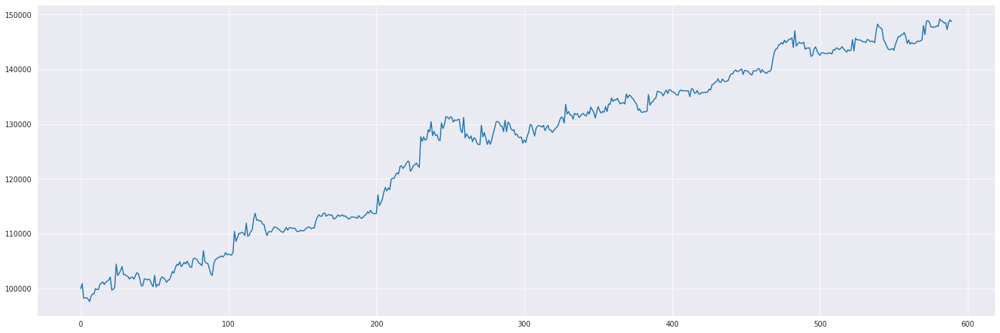

In [ ]:
# для мгновенного вывода результата указываем значение параметра тип='результат'
терра_ии.торговля(нейронка_трейдинг_1, тестовая_выборка, данные, тип='результат')

**Проводим серию экспериментов**

Первый эксперимент

Модель: Выравнивающий + Полносвязный слои

Эпоха №1    Время обучения: 0.64c   Точность на обучающей выборке: 53.89%    Точность на проверочной выборке: 58.64%
Эпоха №2    Время обучения: 0.14c   Точность на обучающей выборке: 67.32%    Точность на проверочной выборке: 70.17%
Эпоха №3    Время обучения: 0.14c   Точность на обучающей выборке: 74.94%    Точность на проверочной выборке: 71.02%
Эпоха №4    Время обучения: 0.13c   Точность на обучающей выборке: 77.74%    Точность на проверочной выборке: 73.05%
Эпоха №5    Время обучения: 0.13c   Точность на обучающей выборке: 79.46%    Точность на проверочной выборке: 71.36%
Эпоха №6    Время обучения: 0.13c   Точность на обучающей выборке: 79.75%    Точность на проверочной выборке: 63.22%
Эпоха №7    Время обучения: 0.15c   Точность на обучающей выборке: 82.43%    Точность на проверочной выборке: 78.14%
Эпоха №8    Время обучения: 0.12c   Точность на обучающей выборке: 86.82%    Точность на проверочной выборке: 79.15%
Эпоха №9    Время обучения: 0.15c   Точность на обучающей выборк

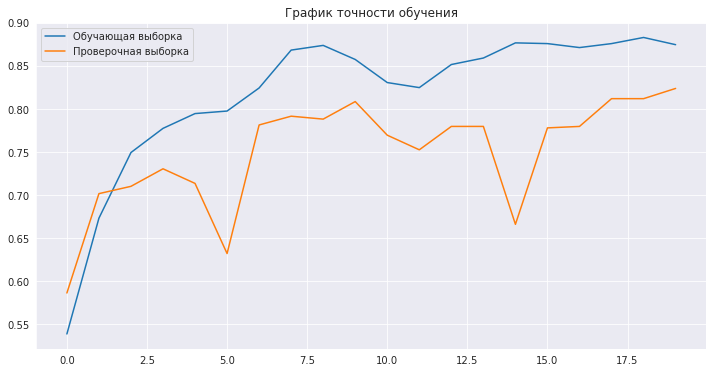

Стартовый капитал: 100000
Прирост после торгов: + 65258
Итого: 165258


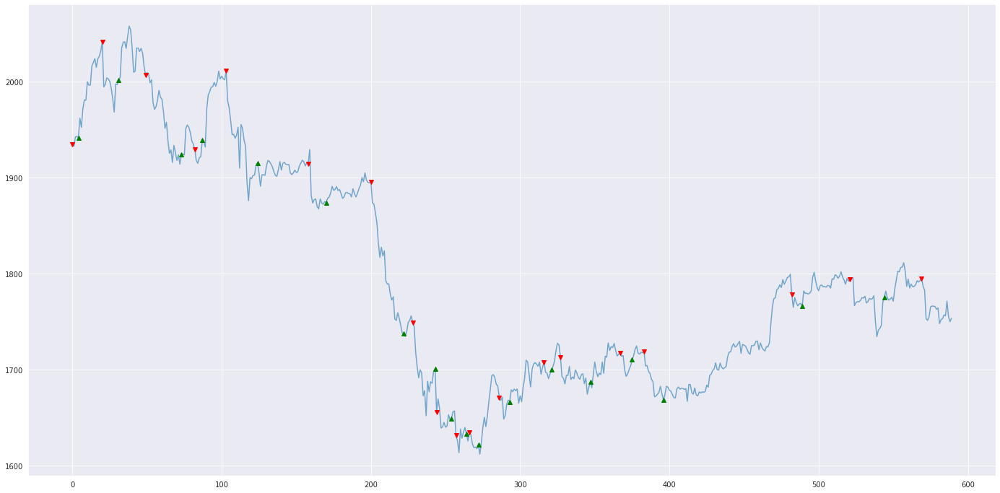

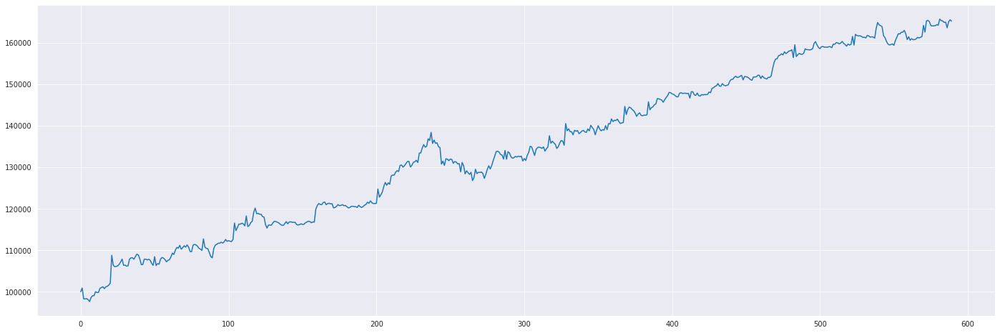

In [ ]:
# Указываем слои создаваемой модели
слои = 'Выравнивающий Полносвязный-2000 Полносвязный-3'

входной_размер = терра_ии.получить_входной_размер(обучающая_выборка)

# Создаем модель
нейронка_трейдинг_2 = терра_ии.создать_сеть(
    слои = слои,
    входной_размер = входной_размер,
    задача = 'временной ряд'
    )

# Обучаем модель
эксперимент_2 = терра_ии.обучение_модели(
    нейронка_трейдинг_2,
    обучающая_выборка, метки_обучающей_выборки,
    тестовая_выборка, метки_тестовой_выборки,
    размер_пакета = 64,
    количество_эпох = 20)

# для мгновенного вывода результата указываем значение параметра тип='результат'
терра_ии.торговля(нейронка_трейдинг_2, тестовая_выборка, данные, тип='результат')

Второй эксперимент

Модель: выравнивающий + несколько полносвязных слоев

Запуск №1   Время обучения: 6.55c Точность на обучающей выборке: 83.26%      Точность на проверочной выборке: 83.39%
Запуск №2   Время обучения: 7.94c Точность на обучающей выборке: 84.18%      Точность на проверочной выборке: 83.22%
Запуск №3   Время обучения: 6.04c Точность на обучающей выборке: 88.33%      Точность на проверочной выборке: 82.03%
Запуск №4   Время обучения: 6.52c Точность на обучающей выборке: 91.88%      Точность на проверочной выборке: 81.36%
Запуск №5   Время обучения: 5.08c Точность на обучающей выборке: 94.77%      Точность на проверочной выборке: 82.54%
Запуск №6   Время обучения: 40.03cТочность на обучающей выборке: 94.02%      Точность на проверочной выборке: 81.69%
Запуск №7   Время обучения: 5.43c Точность на обучающей выборке: 98.79%      Точность на проверочной выборке: 81.36%
Запуск №8   Время обучения: 12.25cТочность на обучающей выборке: 96.99%      Точность на проверочной выборке: 81.69%
Запуск №9   Время обучения: 5.27c Точность на обучающей выборке:

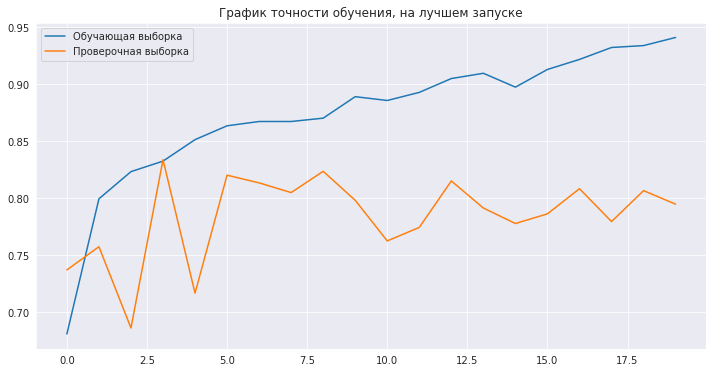

Стартовый капитал: 100000
Прирост после торгов: + 81660
Итого: 181660


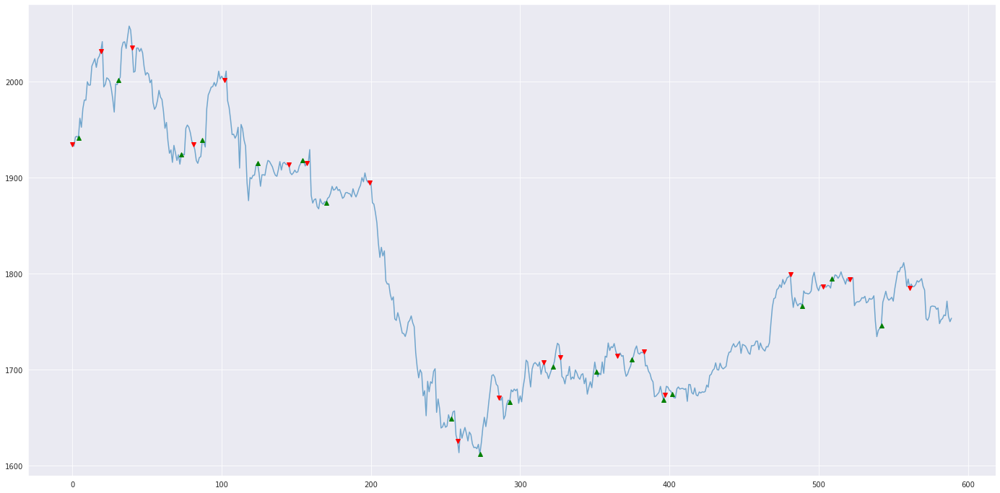

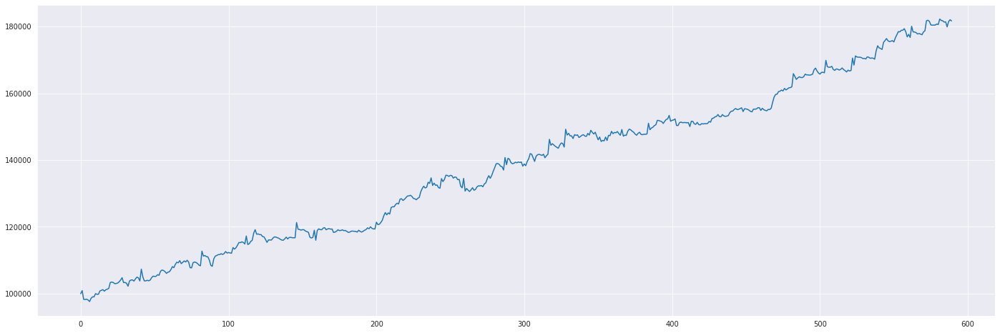

In [ ]:
# Указываем слои создаваемой модели
слои = 'Выравнивающий Полносвязный-2000 Полносвязный-1500 Полносвязный-1000 Полносвязный-500 Полносвязный-250 Полносвязный-3'

входной_размер = терра_ии.получить_входной_размер(обучающая_выборка)

# Создаем модель
нейронка_трейдинг_3 = терра_ии.создать_сеть(
    слои = слои,
    входной_размер = входной_размер,
    задача = 'временной ряд'
    )

# Обучаем модель
эксперимент_3 = терра_ии.обучение_модели(
    нейронка_трейдинг_3,
    обучающая_выборка, метки_обучающей_выборки,
    тестовая_выборка, метки_тестовой_выборки,
    размер_пакета = 64,
    количество_эпох = 20, 
    количество_запусков = 10)

# для мгновенного вывода результата указываем значение параметра тип='результат'
терра_ии.торговля(нейронка_трейдинг_3, тестовая_выборка, данные, тип='результат')

Третий эксперимент

Модель: сложная сеть из нескольких сверточных, выравнивающего и полносвязного слоёв

In [ ]:
# Указываем слои создаваемой модели
слои = 'Сверточный1D-16-5\
 Сверточный1D-32-5\
 Выравнивающий Полносвязный-512 Полносвязный-3'

входной_размер = терра_ии.получить_входной_размер(обучающая_выборка)

# Создаем модель
нейронка_трейдинг_4 = терра_ии.создать_сеть(
    слои = слои,
    входной_размер = входной_размер,
    задача = 'временной ряд'
    )

Создана модель нейронной сети!


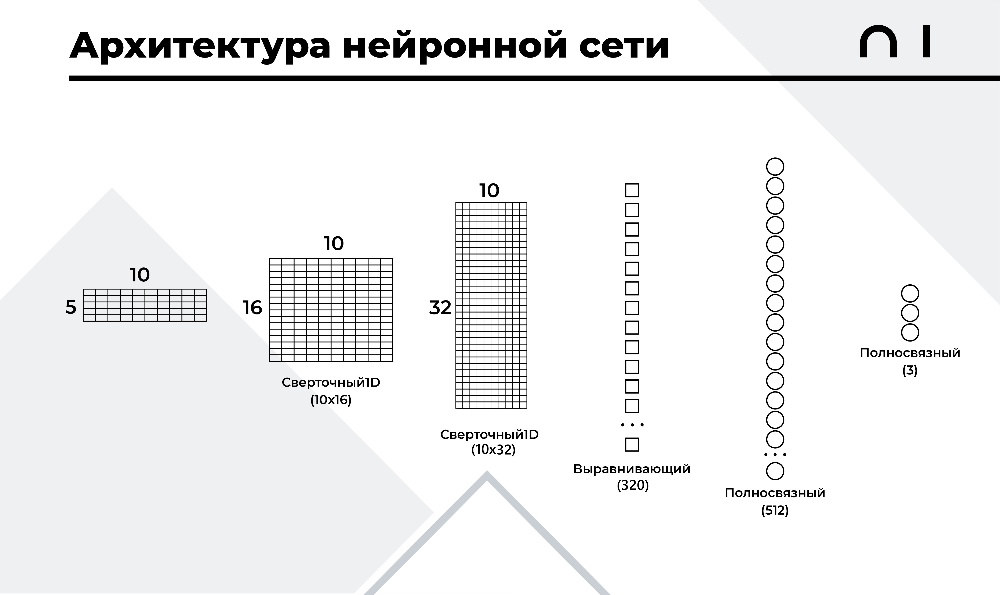

Эпоха №1    Время обучения: 1.36c   Точность на обучающей выборке: 70.13%    Точность на проверочной выборке: 73.73%
Эпоха №2    Время обучения: 0.63c   Точность на обучающей выборке: 80.96%    Точность на проверочной выборке: 81.86%
Эпоха №3    Время обучения: 0.55c   Точность на обучающей выборке: 82.93%    Точность на проверочной выборке: 81.69%
Эпоха №4    Время обучения: 0.64c   Точность на обучающей выборке: 84.9%     Точность на проверочной выборке: 81.53%
Эпоха №5    Время обучения: 0.61c   Точность на обучающей выборке: 87.49%    Точность на проверочной выборке: 81.02%
Эпоха №6    Время обучения: 0.63c   Точность на обучающей выборке: 88.83%    Точность на проверочной выборке: 80.34%
Эпоха №7    Время обучения: 0.56c   Точность на обучающей выборке: 90.84%    Точность на проверочной выборке: 82.2%
Эпоха №8    Время обучения: 0.64c   Точность на обучающей выборке: 92.51%    Точность на проверочной выборке: 81.02%
Эпоха №9    Время обучения: 0.62c   Точность на обучающей выборке

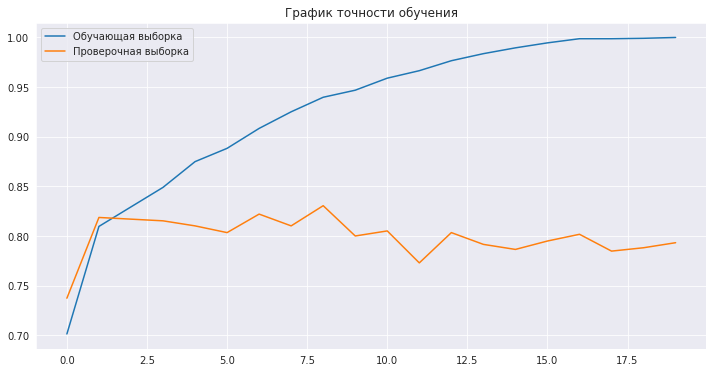

In [ ]:
# Обучаем модель
эксперимент_4 = терра_ии.обучение_модели(
    нейронка_трейдинг_4,
    обучающая_выборка, метки_обучающей_выборки,
    тестовая_выборка, метки_тестовой_выборки,
    размер_пакета = 16,
    количество_эпох = 20)

In [ ]:
# Тестируем модель
терра_ии.тест_модели_торговли(
    нейронка_трейдинг_4, 
    тестовая_выборка, метки_тестовой_выборки,
    данные,
    период_предсказания,
    количество_анализируемых_дней)


Результат теста:
  * Количество отсчетов: 590
  * Правильных предсказаний: 485
  * Ошибочных предсказаний:  105

  * Точность предсказаний: 82.2%


Примеры распознавания

________________________________________
Тест №1
Модель предсказала: нейтральный тренд
Правильный ответ:  нейтральный тренд
Текущая цена:  2035.1
Цена через 1 интервал(а): 2035.1


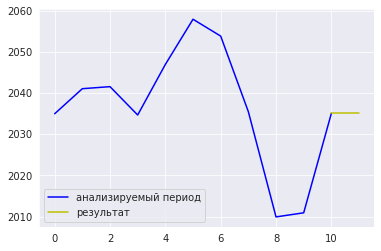

________________________________________
Тест №2
Модель предсказала: нейтральный тренд
Правильный ответ:  нейтральный тренд
Текущая цена:  2031.5
Цена через 1 интервал(а): 2034.7


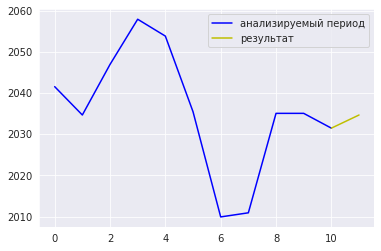

________________________________________
Тест №3
Модель предсказала: падающий тренд
Правильный ответ:  падающий тренд
Текущая цена:  1969.0
Цена через 1 интервал(а): 1951.5


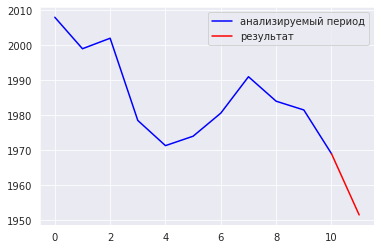

________________________________________
Тест №4
Модель предсказала: растущий тренд
Правильный ответ:  растущий тренд
Текущая цена:  1923.8
Цена через 1  интервал(а): 1951.5


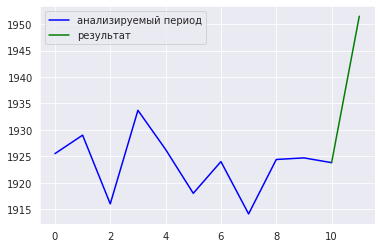

Стартовый капитал: 100000
Прирост после торгов: + 89025
Итого: 189025


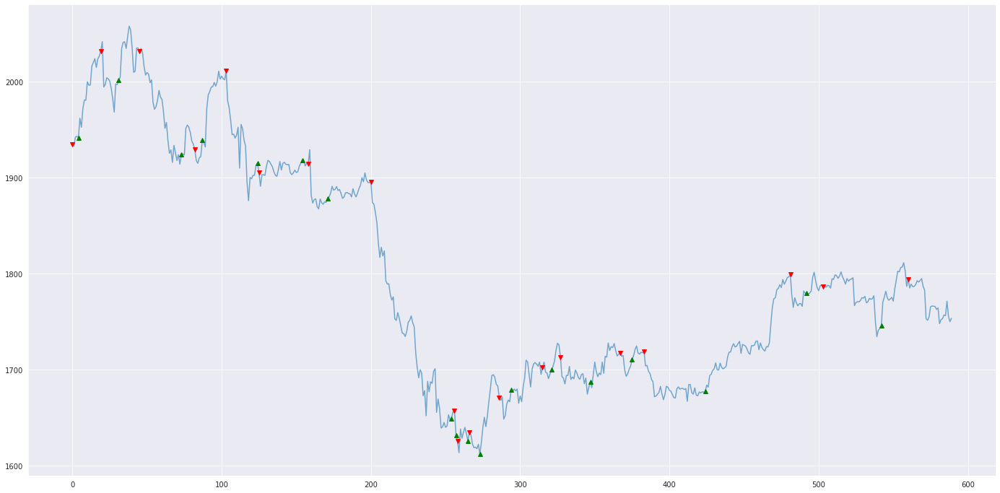

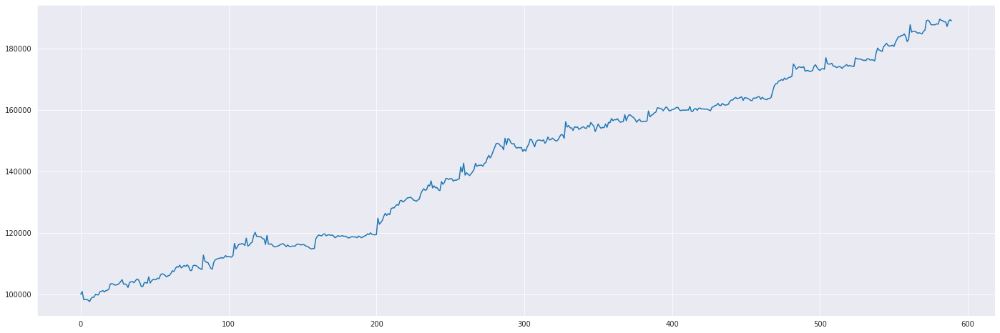

In [ ]:
терра_ии.примеры_распознавания(
          нейронка_трейдинг_4, 
          период_предсказания, 
          количество_анализируемых_дней)

# для мгновенного вывода результата указываем значение параметра тип='результат'
терра_ии.торговля(нейронка_трейдинг_4, тестовая_выборка, данные, тип='результат')

## Распознавание голосовых команд для умного дома.

Создайте нейронную сеть, которая будет распознавать команды "свет", "кондиционер" и "телевизор" (все остальное - фоновый шум)

In [ ]:
# Загружаем базу голосовых команд УМНЫЙ ДОМ
терра_ии.загрузить_базу('УМНЫЙ ДОМ', 
                    справка = 'Показать')

Загрузка данных завершена 

url: https://storage.googleapis.com/terra_ai/DataSets/cHome.zip
Загружена база голосовых команд для умного дома



Пример голосовой команды «Кондиционер»:


Спектр голосовой команды:


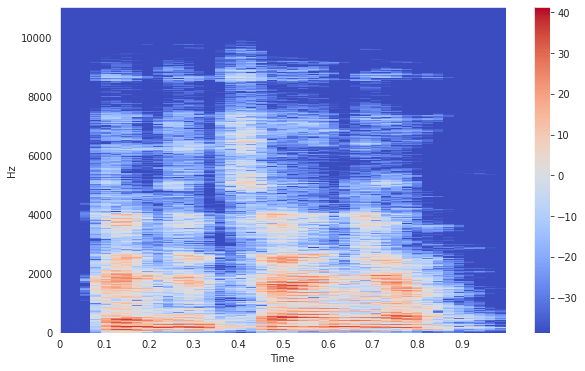

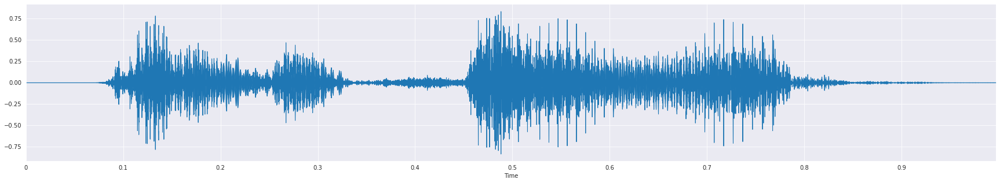



Пример голосовой команды «Свет»:


Спектр голосовой команды:


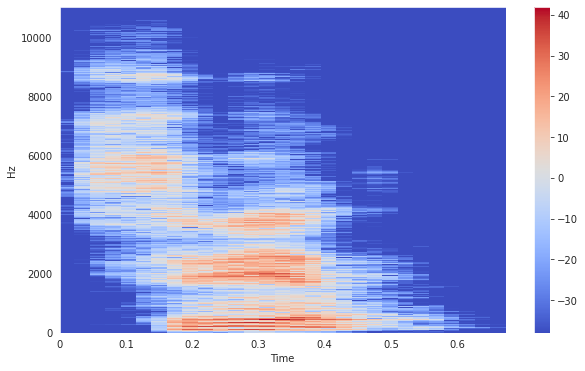

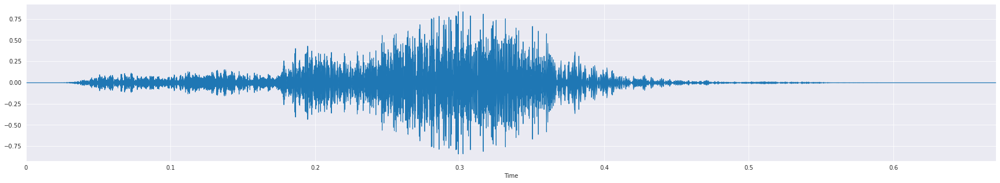



Пример голосовой команды «Телевизор»:


Спектр голосовой команды:


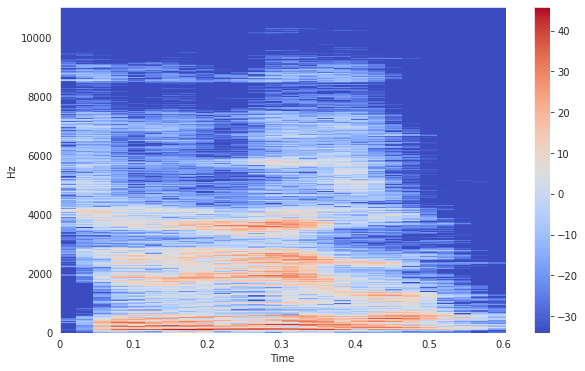

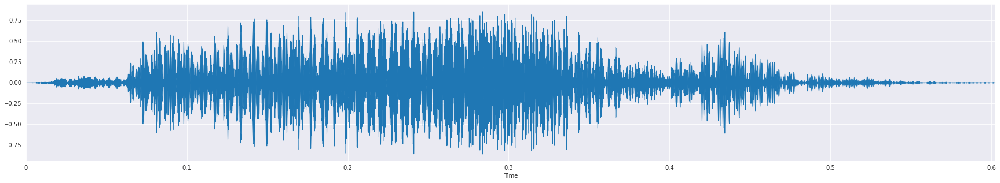



Пример голосовой команды «Фон»:


Спектр голосовой команды:


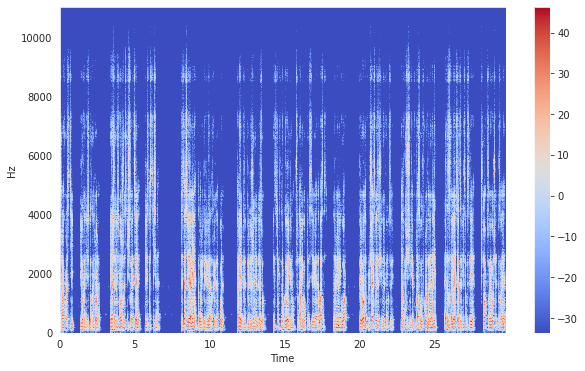

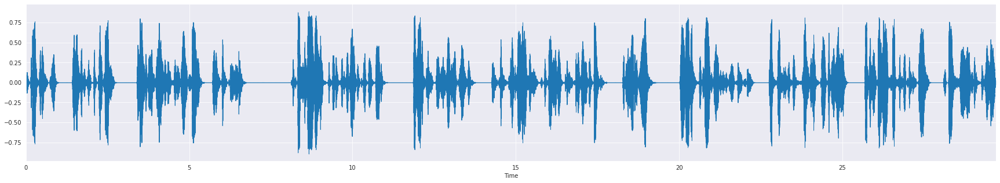

In [ ]:
терра_ии.показать_примеры_голосовых_команд()

Команда: кондиционер
Исходное аудио: 


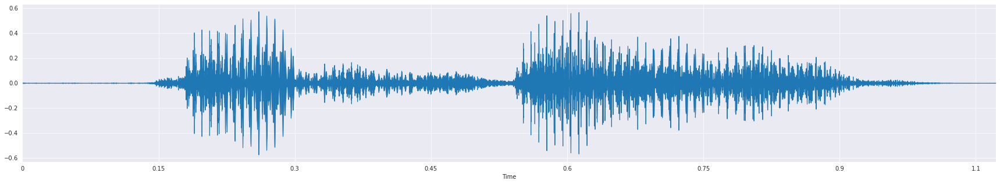



Спектр сигнала:


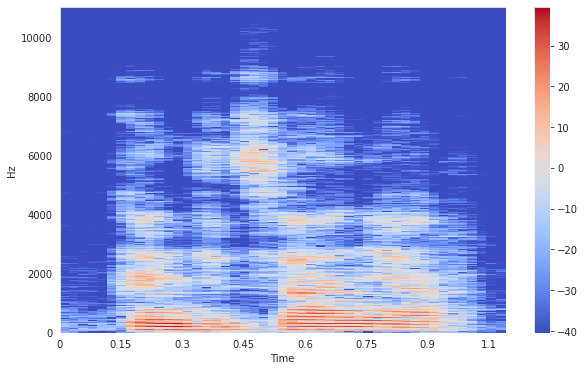

In [ ]:
# Показать пример параметризации аудио-файла 
# Параметр файл может принимать одно из значений: кондиционер, свет, телевизор, фон
терра_ии.параметризация_аудио(
    файл = 'кондиционер'
)

In [ ]:
# Создаем обучающую и проверочную выборки
длина = 0.5 # Задаем длину аудио_отрезка при формировании выборки
шаг = 0.04 # Задаем шаг при формировании выборки
(обучающая_выборка, метки_обучающей_выборки), (тестовая_выборка, метки_тестовой_выборки) = терра_ии.создать_выборки_голосовых_команд(длина, шаг)



Данные успешно загружены. Обработано: 362 аудио

Время обработки: 4 мин 40.41 c


In [ ]:
# Указываем слои содаваемой модели
слои = 'Сверточный2D-8-2 Выравнивающий Полносвязный-128 Полносвязный-64 Полносвязный-4'

# Получаем размер входных данных
входной_размер = терра_ии.получить_входной_размер(обучающая_выборка)

# Создаем модель
нейронка_аудио_1 = терра_ии.создать_сеть(
    слои = слои,
    входной_размер = входной_размер,
    задача='аудио'
    )

Создана модель нейронной сети!


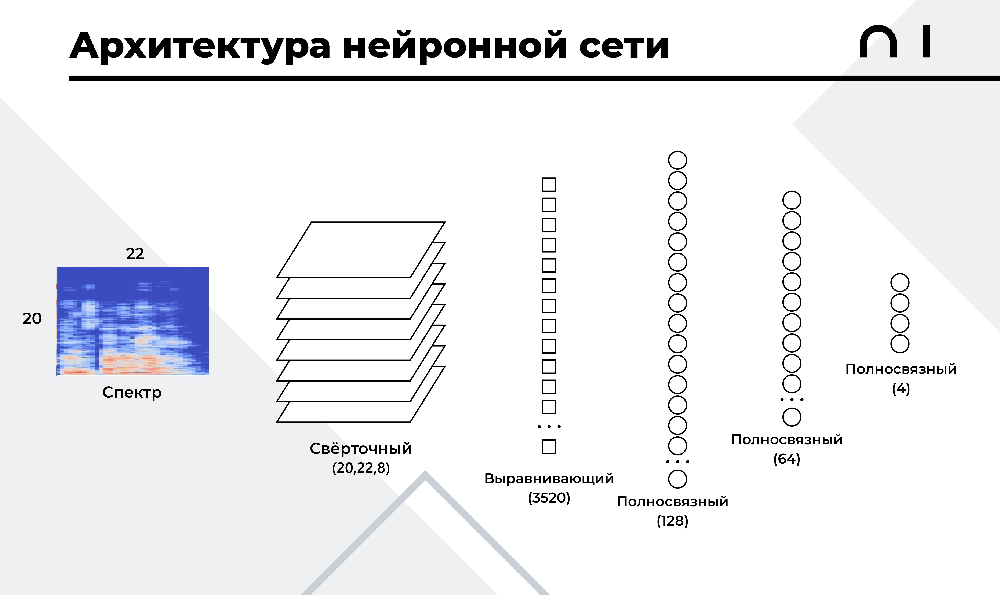

Схема модели:


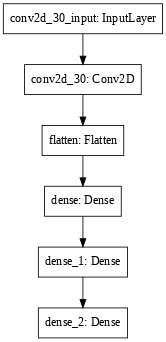

In [ ]:
# Выводим структуру модели
терра_ии.схема_модели(нейронка_аудио_1)

Эпоха №1  Время обучения: 1.27c  Точность на обучающей выборке: 96.82%       Точность на проверочной выборке: 98.91%
Эпоха №2  Время обучения: 0.67c  Точность на обучающей выборке: 99.08%       Точность на проверочной выборке: 99.23%
Эпоха №3  Время обучения: 0.68c  Точность на обучающей выборке: 99.31%       Точность на проверочной выборке: 99.58%
Эпоха №4  Время обучения: 0.67c  Точность на обучающей выборке: 99.82%       Точность на проверочной выборке: 99.75%
Эпоха №5  Время обучения: 0.66c  Точность на обучающей выборке: 99.91%       Точность на проверочной выборке: 99.9%
Эпоха №6  Время обучения: 0.66c  Точность на обучающей выборке: 99.88%       Точность на проверочной выборке: 99.77%
Эпоха №7  Время обучения: 0.68c  Точность на обучающей выборке: 99.58%       Точность на проверочной выборке: 99.58%
Эпоха №8  Время обучения: 0.66c  Точность на обучающей выборке: 99.63%       Точность на проверочной выборке: 99.39%
Эпоха №9  Время обучения: 0.66c  Точность на обучающей выборке: 9

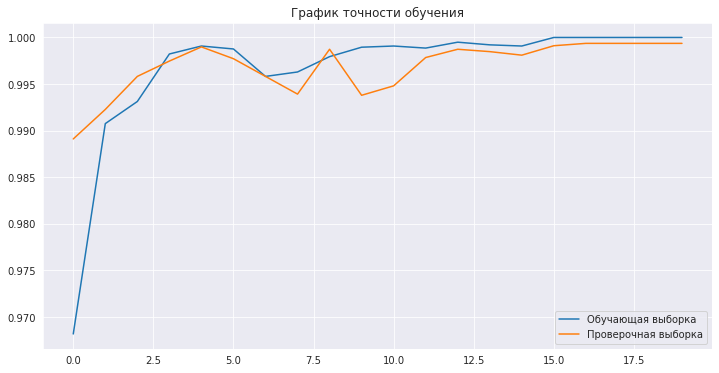

In [ ]:
# Обучаем модель
эксперимент_1 = терра_ии.обучение_модели(
    нейронка_аудио_1,
    обучающая_выборка, метки_обучающей_выборки,
    тестовая_выборка, метки_тестовой_выборки,
    размер_пакета = 128,
    количество_эпох = 20)

### Тестирование модели

Исходное аудио для проверки работы нейронной сети: 



Распознана команда: " КОНДИЦИОНЕР " (вероятность - 99.91 %)


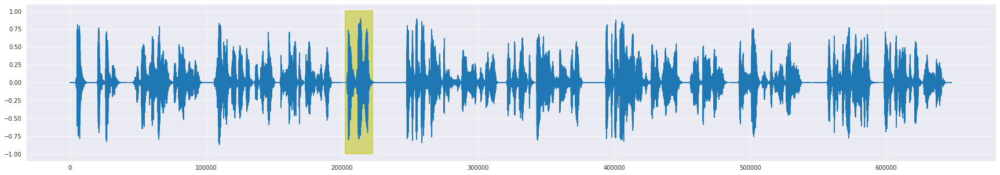

In [ ]:
# Тестируем модель
терра_ии.тест_модели_голосовых_команд(нейронка_аудио_1, порог=0.95, длина=длина, шаг=шаг)

Исходное аудио для проверки работы нейронной сети: 



Распознана команда: " СВЕТ " (вероятность - 99.88 %)


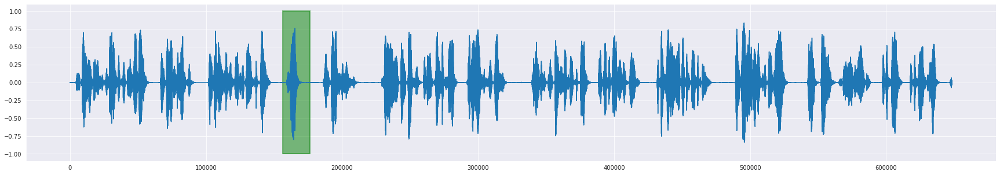

In [ ]:
терра_ии.тест_модели_голосовых_команд(нейронка_аудио_1, порог=0.95, длина=длина, шаг=шаг)

Исходное аудио для проверки работы нейронной сети: 



Распознана команда: " ТЕЛЕВИЗОР " (вероятность - 99.73 %)


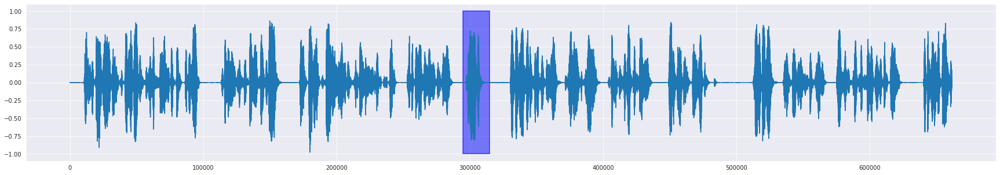

In [ ]:
терра_ии.тест_модели_голосовых_команд(нейронка_аудио_1, порог=0.95, длина=длина, шаг=шаг)

## Задание № 3. Сегментация губ

Напишите нейронную сеть, решающую задачу сегментации губ (можете использовать различные подходы для создания архитектуры)
1. Скачайте базу
2. Покажите примеры из загруженной базы
3. Создайте выборки
4. Создайте модель
5. Продемонстируйте схему созданной модели
6. Обучите свою модель
7. Проведите тестирование


In [ ]:
# Загружаем базу губ
изображения, сегментированные_изображения = терра_ии.загрузить_базу(
    база = 'ГУБЫ',
    справка = 'Показать'
)

Загрузка данных завершена 

url: https://storage.googleapis.com/terra_ai/DataSets/lips.zip
Загружена база сегментации женских губ



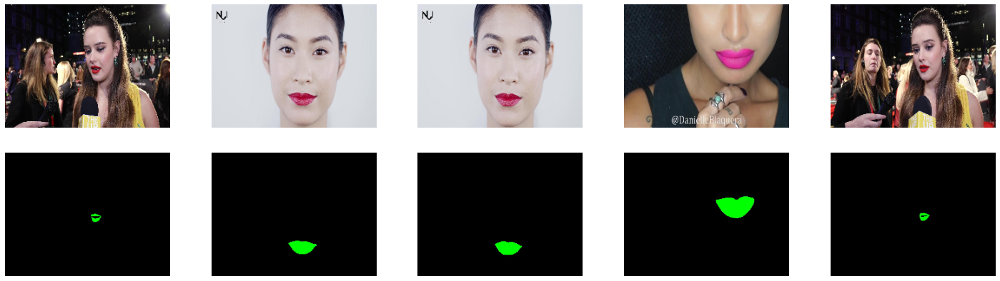

In [ ]:
# Выводим примеры изображений
терра_ии.показать_примеры(
    оригиналы = изображения,
    сегментированные_изображения = сегментированные_изображения
)

In [ ]:
# Формируем данные для обучения
(обучающая_выборка, размеченная_обучающая_выборка), (тестовая_выборка, размеченная_тестовая_выборка) = терра_ии.создать_выборки_для_сегментации(
    изображения, 
    сегментированные_изображения
)

Обработка изображений:   0%|                                                                                  …

Данные загружены. Обработано: 1000 изображений
Время обработки:  636.77 c


Задайте параметры для обучения модели: 
1. Нейронка
2. Обучающая и проверочная выборки
3. Размер пакета
4. Количество эпох

Проведите тест модели

In [ ]:
# Указываем слои для создаваемой модели
блок_вниз_1  =  'Сверточный2D-32-3 Сверточный2D-32-3'
блок_вниз_2  =  'Сверточный2D-64-3 Сверточный2D-64-3'
блок_вниз_3  =  'Сверточный2D-128-3 Сверточный2D-128-3'

блок_внизу   =  'Сверточный2D-256-3 Сверточный2D-256-3'

блок_вверх_1 =  'Объединение Сверточный2D-128-3 Сверточный2D-128-3'
блок_вверх_2 =  'Объединение Сверточный2D-64-3 Сверточный2D-64-3'
блок_вверх_3 =  'Объединение Сверточный2D-32-3 Сверточный2D-32-3'

# Получаем размер входных данных
входной_размер = терра_ии.получить_входной_размер(обучающая_выборка)
# Создаем модель
нейронка = терра_ии.создать_UNET(
    блоки_вниз = [блок_вниз_1, блок_вниз_2, блок_вниз_3],
    блок_внизу = блок_внизу, 
    блоки_вверх = [блок_вверх_1, блок_вверх_2, блок_вверх_3],    
    входной_размер = входной_размер
)

Создана модель нейронной сети!


Схема модели:


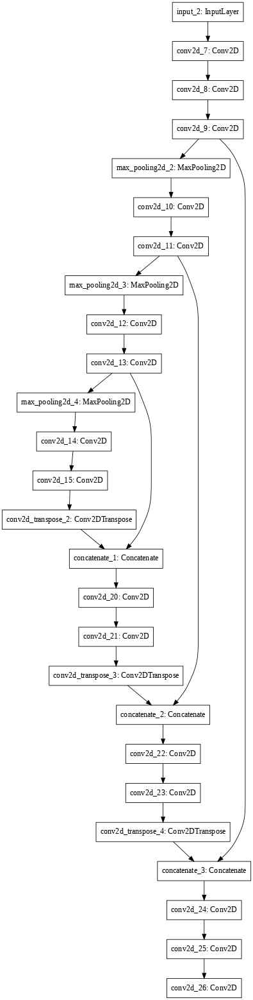

In [ ]:
терра_ии.схема_модели(нейронка)

Эпоха №1    Время обучения: 717.64c Точность на обучающей выборке: 98.19%    Точность на проверочной выборке: 99.82%
Эпоха №2    Время обучения: 715.05c Точность на обучающей выборке: 99.86%    Точность на проверочной выборке: 99.87%
Эпоха №3    Время обучения: 715.22c Точность на обучающей выборке: 99.88%    Точность на проверочной выборке: 99.88%
Эпоха №4    Время обучения: 719.28c Точность на обучающей выборке: 99.9%     Точность на проверочной выборке: 99.88%
Эпоха №5    Время обучения: 718.18c Точность на обучающей выборке: 99.9%     Точность на проверочной выборке: 99.75%
Эпоха №6    Время обучения: 719.1c  Точность на обучающей выборке: 99.89%    Точность на проверочной выборке: 99.89%
Эпоха №7    Время обучения: 717.45c Точность на обучающей выборке: 99.9%     Точность на проверочной выборке: 99.88%
Эпоха №8    Время обучения: 719.18c Точность на обучающей выборке: 99.9%     Точность на проверочной выборке: 99.9%
Эпоха №9    Время обучения: 717.07c Точность на обучающей выборке

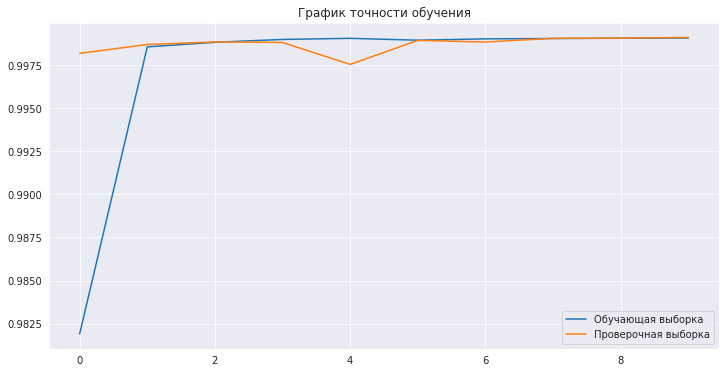

In [ ]:
терра_ии.обучение_модели(
    нейронка,
    обучающая_выборка, размеченная_обучающая_выборка,
    тестовая_выборка, размеченная_тестовая_выборка,
    размер_пакета = 8,
    количество_эпох = 10 
    )

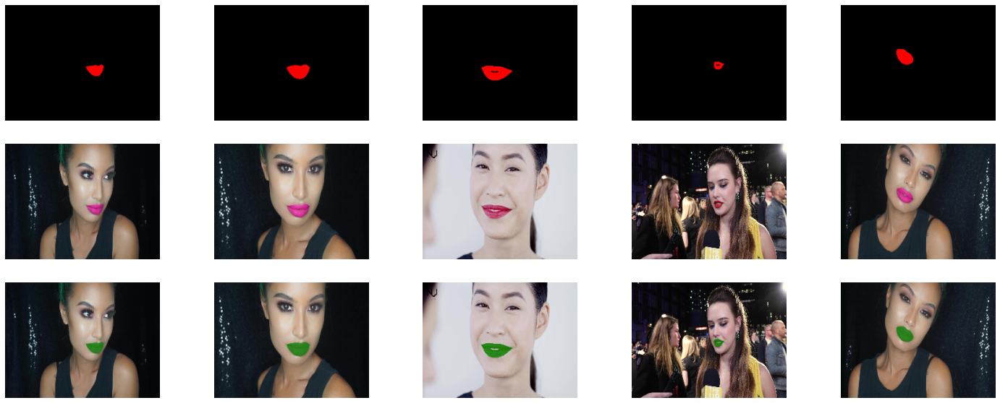

In [ ]:
# Тестирование модели
терра_ии.тест_модели_сегментации(
    нейронка,
    тестовые_изображения = тестовая_выборка)